In [ ]:
# Install required libs

### please update Albumentations to version>=0.3.0 for `Lambda` transform support
#!pip install -U albumentations>=0.3.0 --user

In [1]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-uuctdptp
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-uuctdptp
     |████████████████████████████████| 37.1 MB 1.2 MB/s 
  Created wheel for albumentations: filename=albumentations-1.1.0-py3-none-any.whl size=102899 sha256=25fe96bbf094780de91533afa9318ee095930b64962b130e2ead3334dd80ebcd
  Stored in directory: /tmp/pip-ephem-wheel-cache-mynmx27c/wheels/63/11/1a/c77caf3ae9b9b6d57b3ee5e6a41a50f3bc12c66a70f6b90bf0
Successfully built albumentations
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [2]:
!pip install -U segmentation-models

     |████████████████████████████████| 50 kB 8.1 MB/s 


In [3]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
from skimage import io, transform
import tensorflow as tf
import tensorflow.keras.backend as K

In [4]:
from google.colab import drive 
drive.mount("/content/drive") 

Mounted at /content/drive


In [5]:
DATA_DIR = '/content/drive/MyDrive/MS_Project/'
x_train_dir = os.path.join(DATA_DIR, 'Dataset/Train/frames')
y_train_dir = os.path.join(DATA_DIR, 'Dataset/Train/Masks')

x_valid_dir = os.path.join(DATA_DIR, 'Dataset/Val/frames')
y_valid_dir = os.path.join(DATA_DIR, 'Dataset/Val/masks')

x_test_dir = os.path.join(DATA_DIR, 'Dataset/Test/frames')
y_test_dir = os.path.join(DATA_DIR, 'Dataset/Test/Masks')

In [6]:
path = os.path.join(DATA_DIR, 'Test/Output_samples/Dense-UNetsample.png')

In [7]:
# helper function for data visualization
def visualize(save=False,**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
        if save:
            plt.savefig(path)
    plt.show()
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

In [8]:
# classes for data loading and preprocessing
class Dataset:
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
    CLASSES = ['Pitch']
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            classes=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)
        

        image = transform.resize(image, (544, 544))
        mask = transform.resize(mask, (544, 544))

        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        return len(self.ids)
    
    
class Dataloder(keras.utils.Sequence):
    """Load data from dataset and form batches
    
    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return tuple(batch)
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

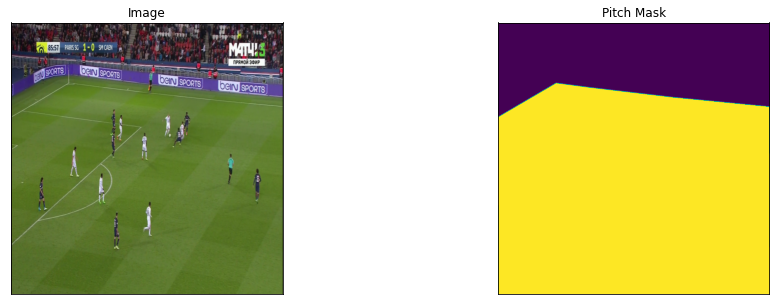

(544, 544, 3)

In [9]:
# Lets look at data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=['Pitch'])

image, mask = dataset[5] # get some sample
visualize(
    image=image, 
    pitch_mask=mask.squeeze(),
)
image.shape

In [ ]:
import albumentations as A

In [ ]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# define heavy augmentations
def get_training_augmentation():
    train_transform = [

        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0),
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(544, 544)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

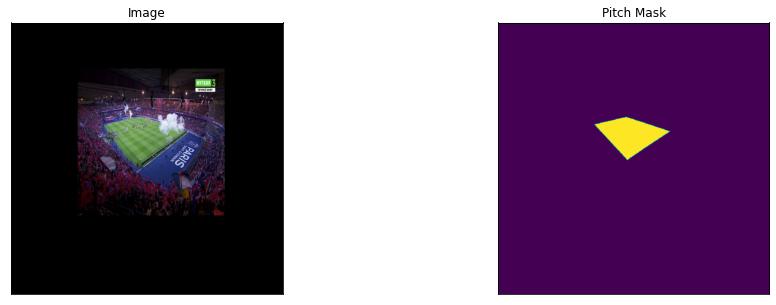

In [ ]:
# Lets look at augmented data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=['Pitch'], augmentation=get_training_augmentation())

image, mask = dataset[12] # get some sample
visualize(
    image=image, 
    Pitch_mask=mask.squeeze(),
)

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')

sm.framework()

Segmentation Models: using `keras` framework.


'tf.keras'

In [ ]:
BACKBONE = 'densenet121'
BATCH_SIZE = 10
CLASSES = ['Pitch']
LR = 0.0001
EPOCHS = 50

preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
# define network parameters
n_classes = 1 
activation = 'sigmoid' 



In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/

In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_DL_FL_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
valid_dataloader[0][0].shape
valid_dataloader[0][1].shape 

(1, 544, 544)

In [ ]:
len(valid_dataloader)

149

# Model with DL+FL

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 1587s 9s/step - loss: 0.7655 - iou_score: 0.2490 - f1-score: 0.3973 - false_negatives: 87091152.0000 - false_positives: 7475823.0000 - true_negatives: 214590144.0000 - true_positives: 185056080.0000 - val_loss: 0.9075 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 0.0000e+00
Epoch 2/50
167/167 [==============================] - 430s 3s/step - loss: 0.7125 - iou_score: 0.2315 - f1-score: 0.3723 - false_negatives: 117369480.0000 - false_positives: 1389236.0000 - true_negatives: 221537872.0000 - true_positives: 153916512.0000 - val_loss: 1.2360 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 0.0000e+00
Epoch 3/50
167/167 [==============================] - 427s 3s/step - loss: 0.7036 

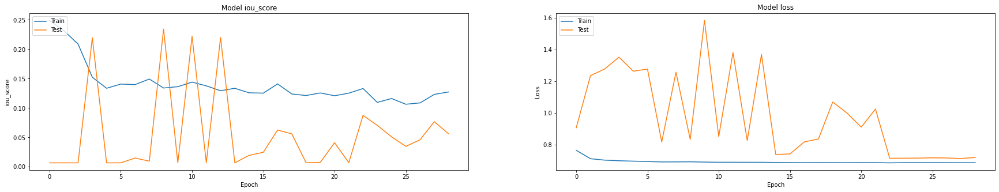

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_DL_FL_b10_IOU0.2342.h5')

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

169/169 [==============================] - 301s 2s/step - loss: 0.8340 - iou_score: 0.2322 - f1-score: 0.3735 - false_negatives: 1119275.0000 - false_positives: 8811940.0000 - true_negatives: 5710175.0000 - true_positives: 34371784.0000
Loss: 0.83399
: 0.23224
: 0.3735
: 1.1193e+06
: 8.8119e+06
: 5.7102e+06
: 3.4372e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.83399
IOU:0.23224
F1 Score:0.3735
FN:1119275.0
FP:8811940.0
TN:5710175.0
TP:34371784.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp}')

SP:0.3932054662836646


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.96846


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

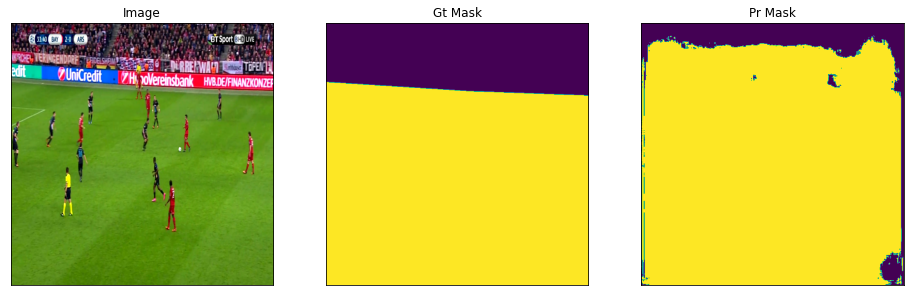

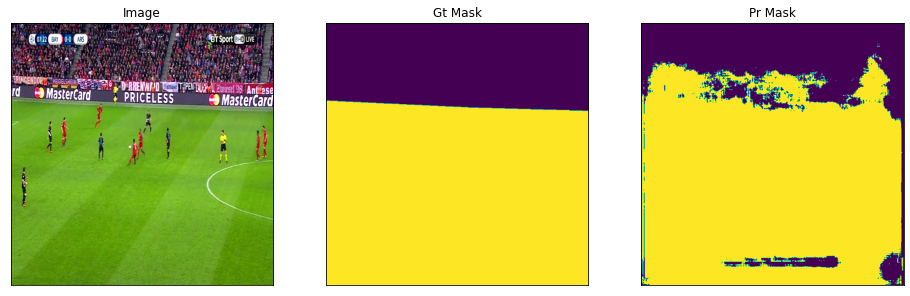

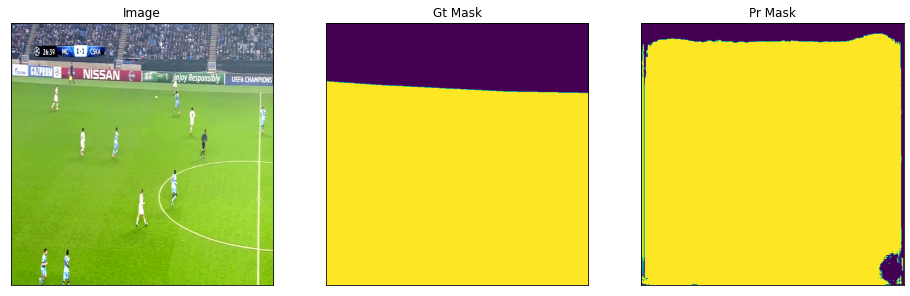

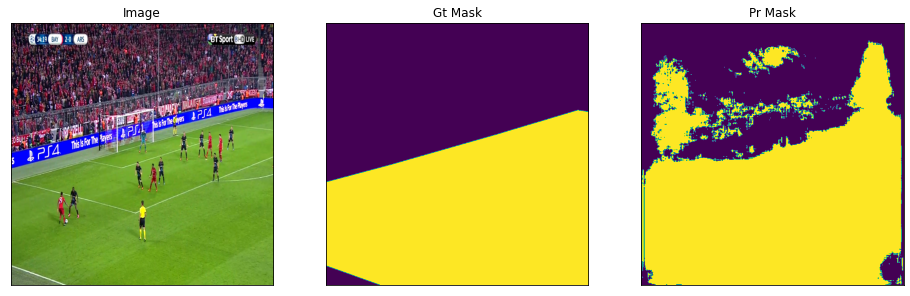

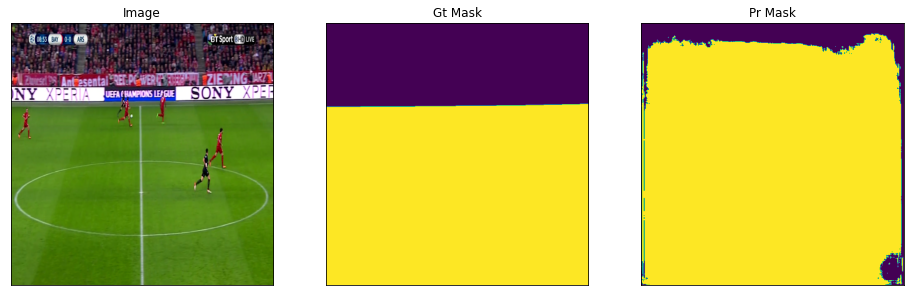

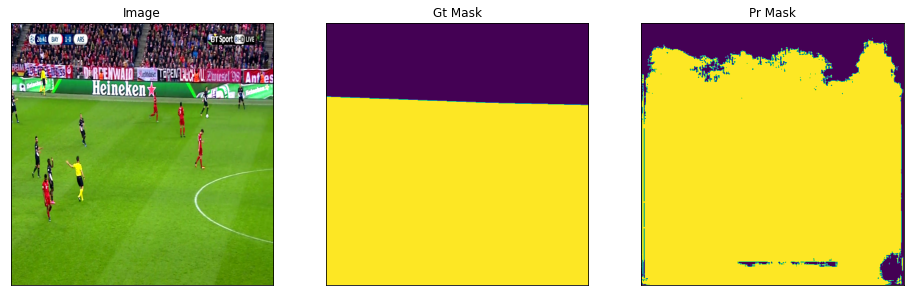

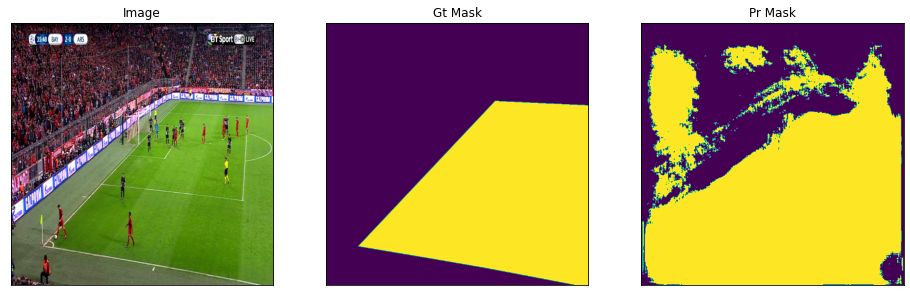

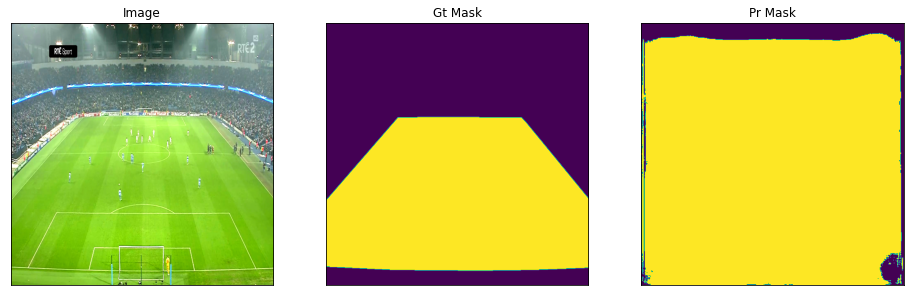

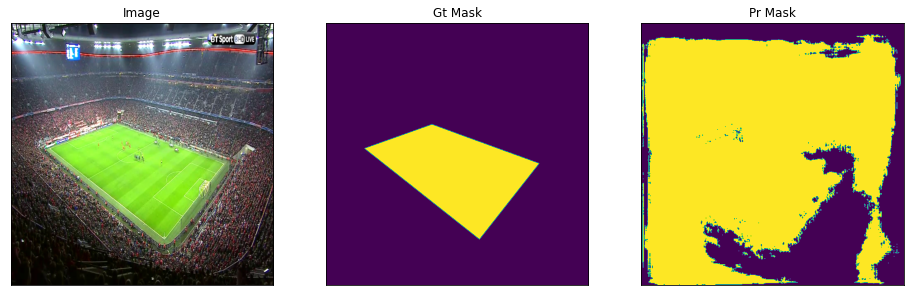

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save = False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_DL_FL_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 457s 3s/step - loss: 0.7269 - iou_score: 0.2268 - f1-score: 0.3682 - false_negatives_1: 131146696.0000 - false_positives_1: 2340586.0000 - true_negatives_1: 217370592.0000 - true_positives_1: 142763392.0000 - val_loss: 1.0801 - val_iou_score: 3.8143e-06 - val_f1-score: 7.5612e-06 - val_false_negatives_1: 32806818.0000 - val_false_positives_1: 29.0000 - val_true_negatives_1: 11287495.0000 - val_true_positives_1: 120.0000
Epoch 2/50
139/139 [==============================] - 425s 3s/step - loss: 0.7028 - iou_score: 0.1994 - f1-score: 0.3293 - false_negatives_1: 162085536.0000 - false_positives_1: 757000.0000 - true_negatives_1: 217321728.0000 - true_positives_1: 113457016.0000 - val_loss: 1.2108 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 3/50
139/139 [============================

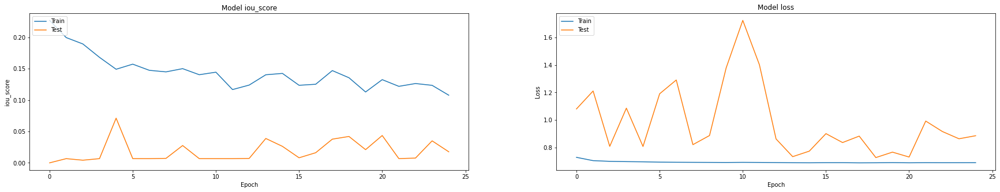

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_DL_FL_b12_IOU0.0711.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Loss: 0.81777
: 0.072353
: 0.13405
: 3.084e+07
: 4.4982e+06
: 1.0024e+07
: 4.6513e+06


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.81777
IOU:0.072353
F1 Score:0.13405
FN:30839738.0
FP:4498195.0
TN:10023920.0
TP:4651328.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp}')

SP:0.6902520741641283


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'SP:{Sensitivity:.5}')

SP:0.13106


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

Output hidden; open in https://colab.research.google.com to view.

# Model with JL

In [ ]:
BATCH_SIZE = 10

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        JaccardLoss = sm.losses.JaccardLoss()
        total_loss = JaccardLoss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 437s 2s/step - loss: 0.7609 - iou_score: 0.2782 - f1-score: 0.4346 - false_negatives_3: 24397798.0000 - false_positives_3: 6960353.0000 - true_negatives_3: 215366160.0000 - true_positives_3: 247488784.0000 - val_loss: 0.9504 - val_iou_score: 6.0079e-04 - val_f1-score: 0.0012 - val_false_negatives_3: 32786742.0000 - val_false_positives_3: 5823.0000 - val_true_negatives_3: 11281701.0000 - val_true_positives_3: 20198.0000
Epoch 2/50
167/167 [==============================] - 398s 2s/step - loss: 0.7278 - iou_score: 0.2875 - f1-score: 0.4466 - false_negatives_3: 14250473.0000 - false_positives_3: 3331145.0000 - true_negatives_3: 217247376.0000 - true_positives_3: 259384064.0000 - val_loss: 0.9853 - val_iou_score: 7.8967e-06 - val_f1-score: 1.5771e-05 - val_false_negatives_3: 32806692.0000 - val_false_positives_3: 202.0000 - val_true_negatives_3: 11287322.0000 - val_true_positives_3: 254.0000
Epoch 3/50
167/167 [=========================

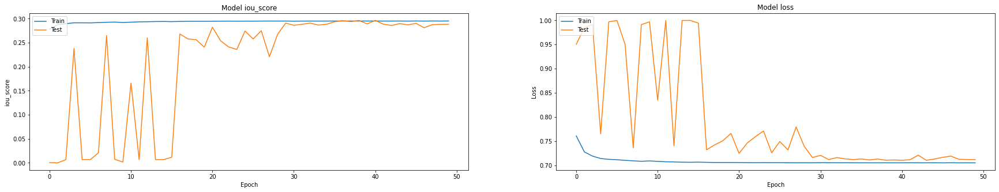

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL_b10_IOU0.2964.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Loss: 0.71265
: 0.29939
: 0.45679
: 2.3043e+05
: 1.412e+05
: 1.4381e+07
: 3.5261e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.71265
IOU:0.29939
F1 Score:0.45679
FN:230430.0
FP:141195.0
TN:14380920.0
TP:35260636.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.99028


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.99351


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(155,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        JaccardLoss = sm.losses.JaccardLoss()
        total_loss = JaccardLoss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 457s 3s/step - loss: 0.7569 - iou_score: 0.2737 - f1-score: 0.4288 - false_negatives: 38159216.0000 - false_positives: 4967287.0000 - true_negatives: 217637264.0000 - true_positives: 232857440.0000 - val_loss: 0.9262 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806936.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 2.0000
Epoch 2/50
139/139 [==============================] - 413s 3s/step - loss: 0.7266 - iou_score: 0.2878 - f1-score: 0.4469 - false_negatives: 14063524.0000 - false_positives: 3182408.0000 - true_negatives: 220719136.0000 - true_positives: 255656128.0000 - val_loss: 0.9532 - val_iou_score: 0.0044 - val_f1-score: 0.0085 - val_false_negatives: 32642916.0000 - val_false_positives: 7092.0000 - val_true_negatives: 11280432.0000 - val_true_positives: 164024.0000
Epoch 3/50
139/139 [==============================] - 414s 3s/step - loss: 0.7193 - iou_

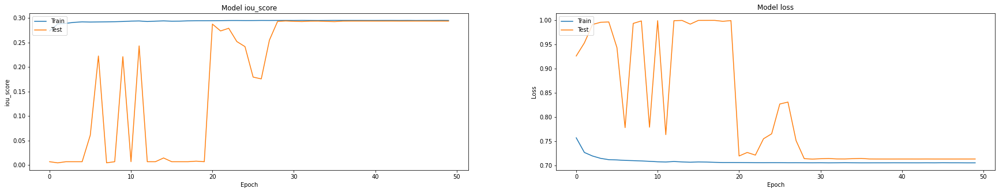

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL_b12_IOU0.2940.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


In [ ]:
print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("{:.5}".format(value))

Loss: 0.7131
0.29893
0.45597
3.0838e+05
8.9401e+04
1.4433e+07
3.5183e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.7131
IOU:0.29893
F1 Score:0.45597
FN:308384.0
FP:89401.0
TN:14432714.0
TP:35182680.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.99384


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.99131


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(155,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

Output hidden; open in https://colab.research.google.com to view.

# Model with JL_DL





In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        JaccardLoss = sm.losses.JaccardLoss()
        total_loss = JaccardLoss+dice_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL+DL_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 443s 3s/step - loss: 1.3339 - iou_score: 0.2784 - f1-score: 0.4349 - false_negatives_1: 24547834.0000 - false_positives_1: 7430234.0000 - true_negatives_1: 214273776.0000 - true_positives_1: 247369456.0000 - val_loss: 1.9185 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 2/50
139/139 [==============================] - 401s 3s/step - loss: 1.2851 - iou_score: 0.2874 - f1-score: 0.4465 - false_negatives_1: 13105944.0000 - false_positives_1: 3606278.0000 - true_negatives_1: 217238016.0000 - true_positives_1: 259671024.0000 - val_loss: 1.9756 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 3/50
139/139 [==============================] 

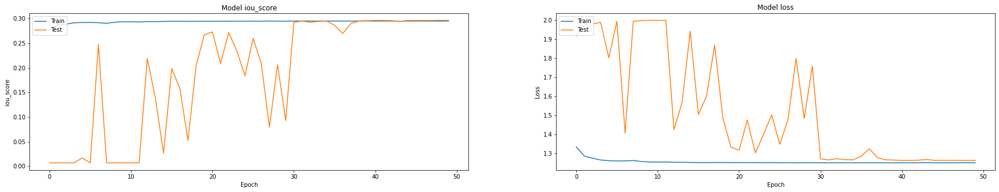

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL+DL_b12_IOU0.2964.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Loss: 1.2669
: 0.29983
: 0.45727
: 2.6965e+05
: 7.4854e+04
: 1.4447e+07
: 3.5221e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.2669
IOU:0.29983
F1 Score:0.45727
FN:269648.0
FP:74854.0
TN:14447261.0
TP:35221424.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.99485


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.9924


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)


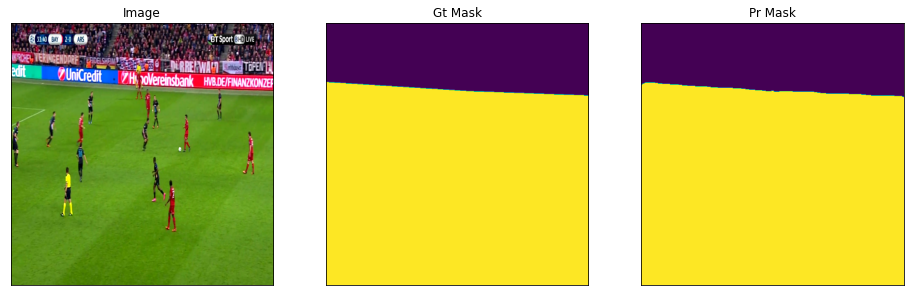

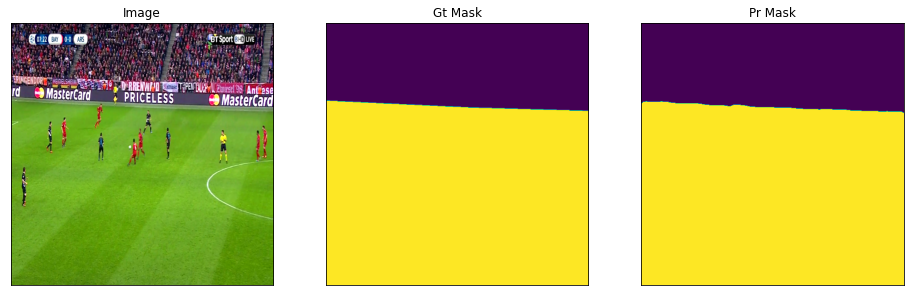

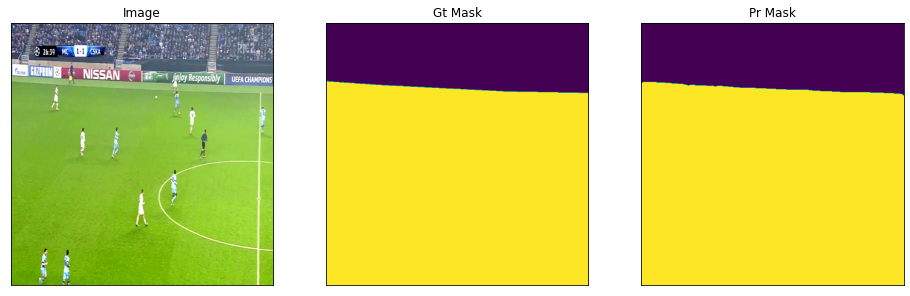

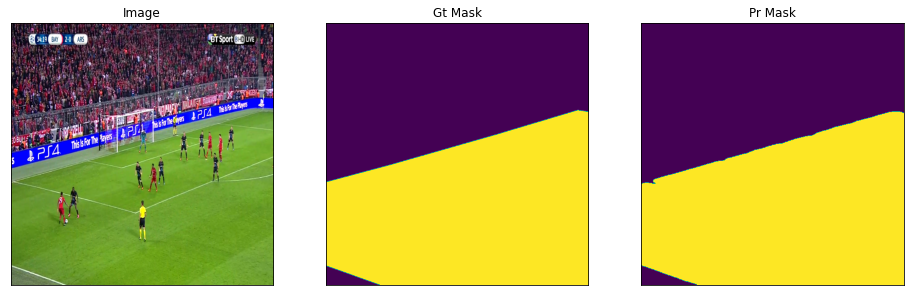

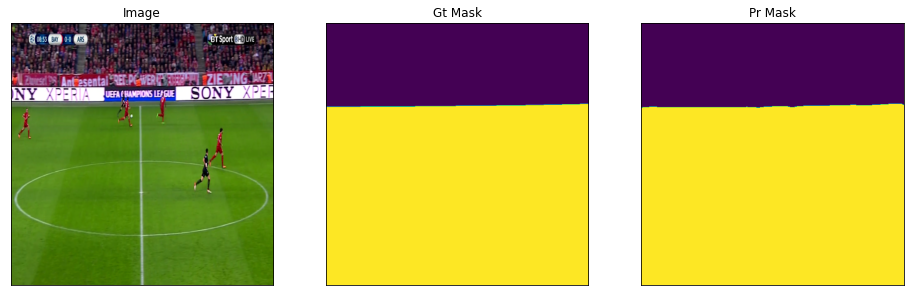

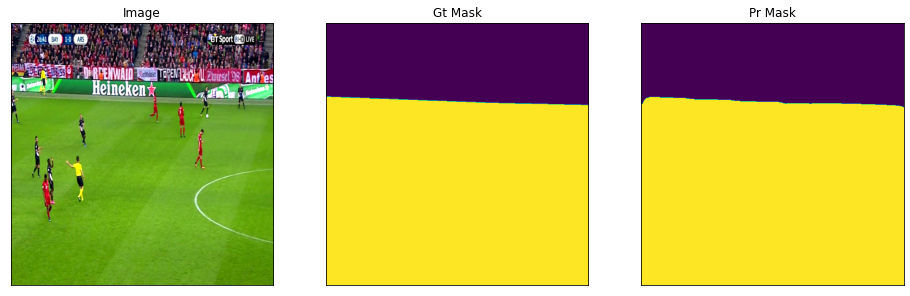

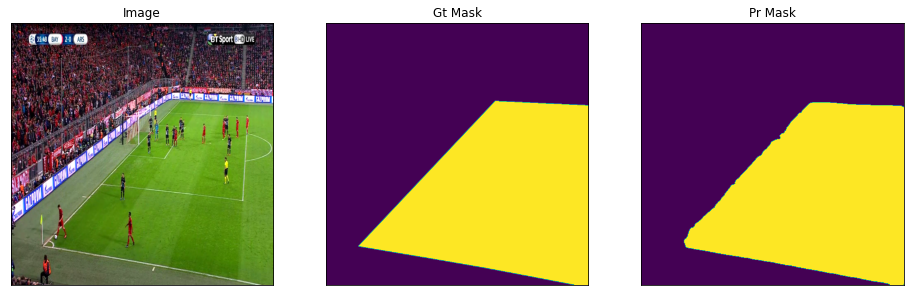

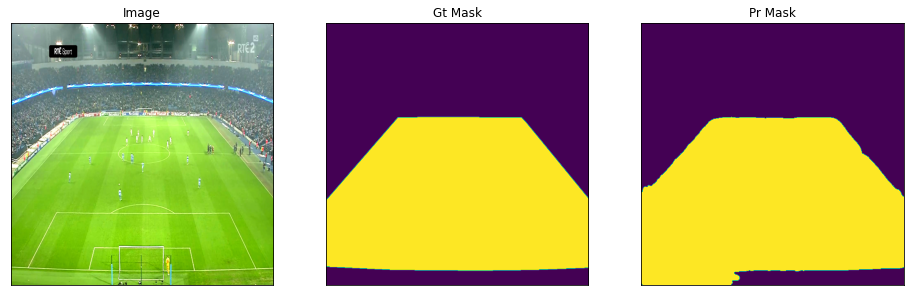

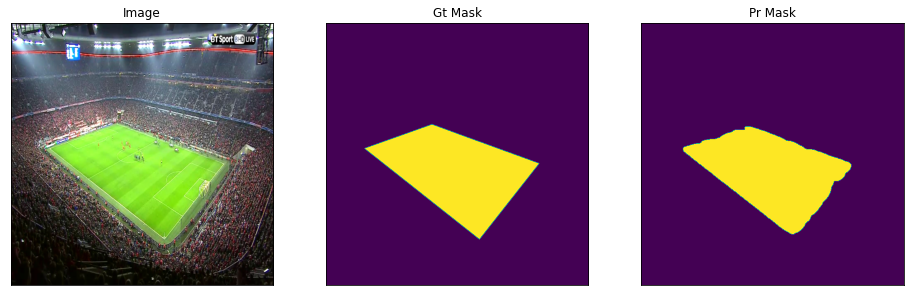

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

In [ ]:
BATCH_SIZE = 10

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights='imagenet',)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        total_loss = dice_loss + (1 * focal_loss)
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    tf.debugging.set_log_device_placement(False)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        JaccardLoss = sm.losses.JaccardLoss()
        total_loss = JaccardLoss+dice_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544, 544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL+DL_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 1756s 10s/step - loss: 1.3812 - iou_score: 0.2767 - f1-score: 0.4329 - false_negatives: 18857572.0000 - false_positives: 12857958.0000 - true_negatives: 200221056.0000 - true_positives: 262276480.0000 - val_loss: 1.7905 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 0.0000e+00
Epoch 2/50
167/167 [==============================] - 425s 3s/step - loss: 1.3017 - iou_score: 0.2884 - f1-score: 0.4477 - false_negatives: 9525761.0000 - false_positives: 3846593.0000 - true_negatives: 220948288.0000 - true_positives: 259892432.0000 - val_loss: 1.9084 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 0.0000e+00
Epoch 3/50
167/167 [==============================] - 438s 3s/step - loss: 1.2814 

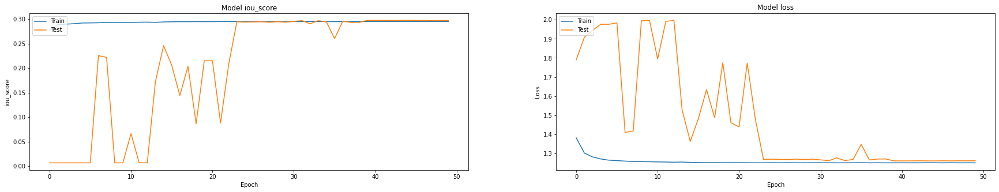

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL+DL_b10_IOU0.2972.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


In [ ]:
print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

Loss: 1.2706
: 0.29834
: 0.4551
: 3.0090e+05
: 9.2897e+04
: 1.4429e+07
: 3.519e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.2706
IOU:0.29834
F1 Score:0.4551
FN:300905.0
FP:92897.0
TN:14429218.0
TP:35190168.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.9936


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.99152


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

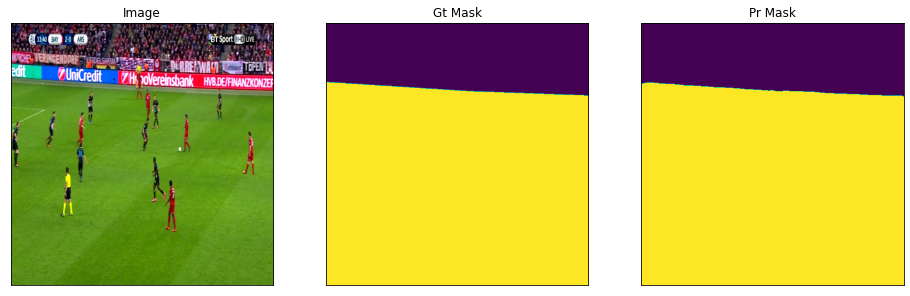

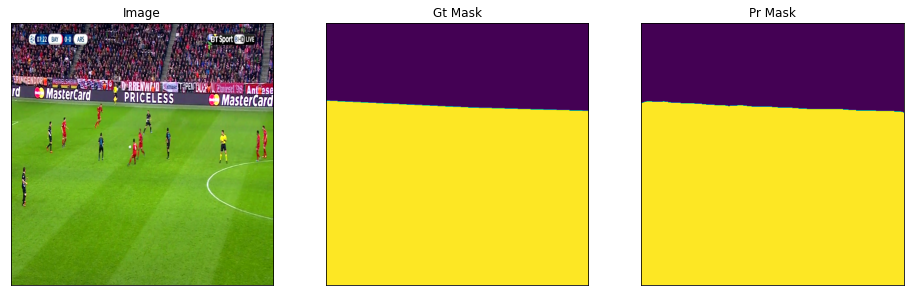

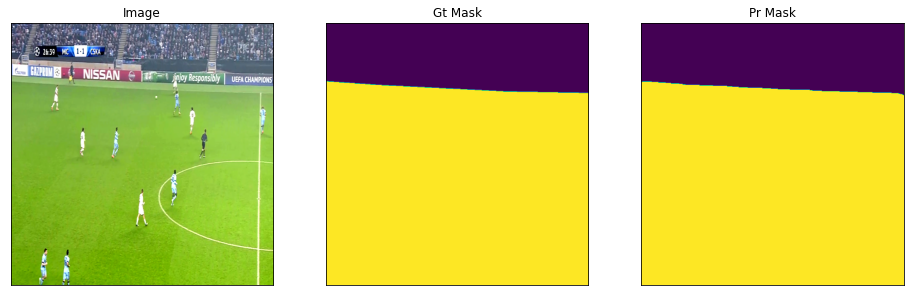

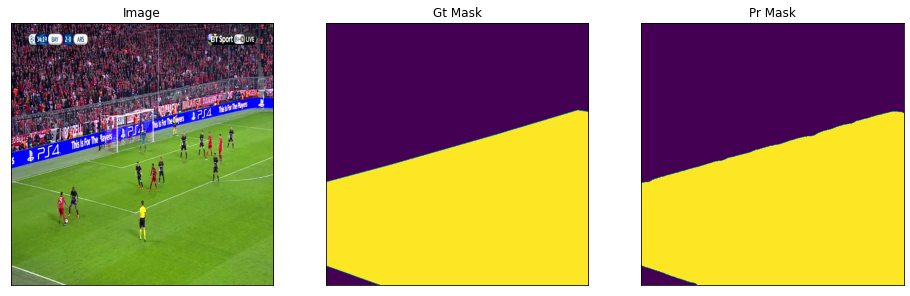

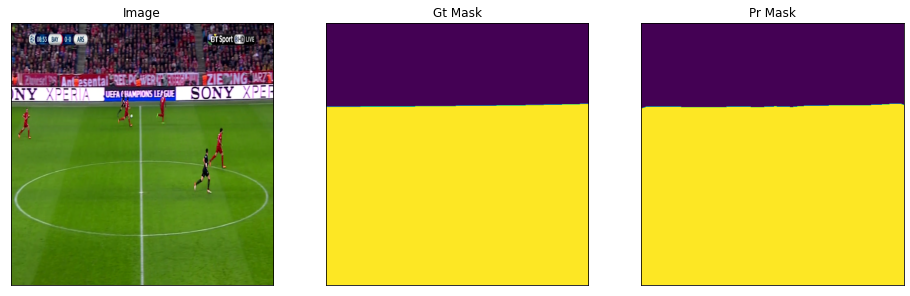

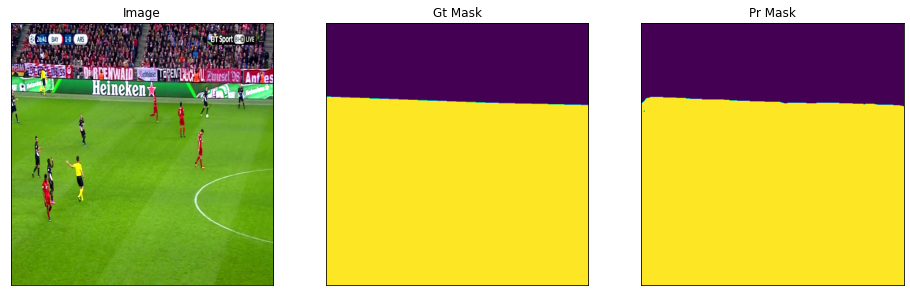

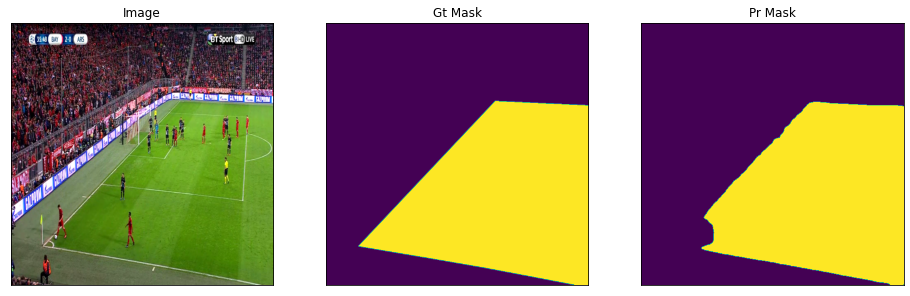

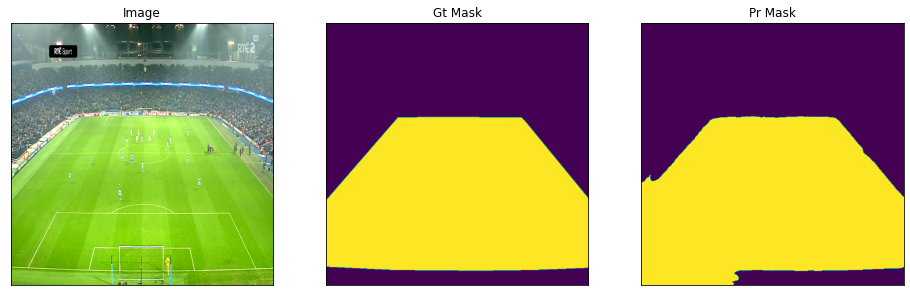

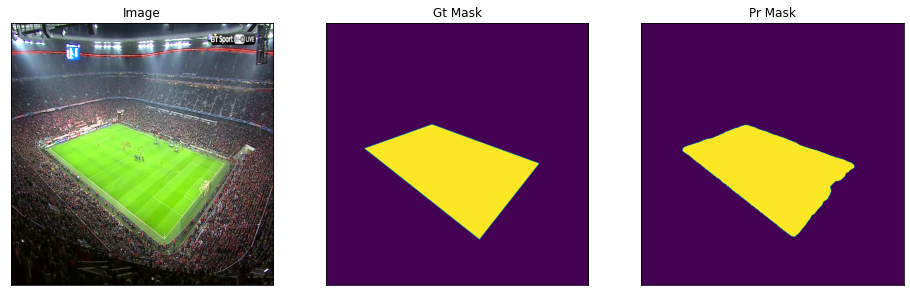

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

#Model with JPL

In [ ]:
BATCH_SIZE = 10

In [ ]:
def jaccard_pow_loss(y_true, y_pred, p_value=2.0,smooth = 10):
    p_value = POWER_VALUE
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)

    intersection = K.sum(y_true_f * y_pred_f)
    term_true = K.sum(K.pow(y_true_f, p_value))
    term_pred = K.sum(K.pow(y_pred_f, p_value))
    union = term_true + term_pred - intersection
    return 1 - ((intersection + smooth) / (union + smooth))

In [ ]:
POWER_VALUE = 1.5

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        total_loss = jaccard_pow_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        total_loss = jaccard_pow_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]
        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JPL_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 472s 3s/step - loss: 0.6447 - iou_score: 0.2599 - f1-score: 0.4118 - false_negatives_1: 70595160.0000 - false_positives_1: 6322467.0000 - true_negatives_1: 219202976.0000 - true_positives_1: 198092448.0000 - val_loss: 0.8943 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 2/50
167/167 [==============================] - 431s 3s/step - loss: 0.6142 - iou_score: 0.2098 - f1-score: 0.3456 - false_negatives_1: 155552448.0000 - false_positives_1: 476959.0000 - true_negatives_1: 222584432.0000 - true_positives_1: 115599272.0000 - val_loss: 0.9647 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 3/50
167/167 [==============================] 

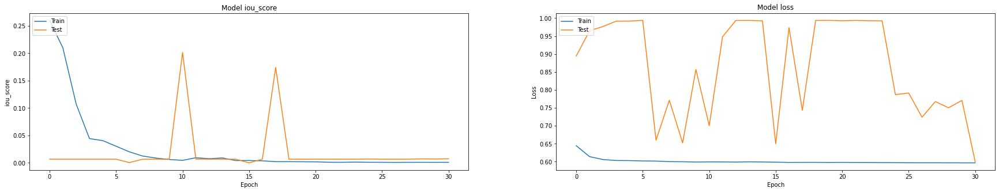

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JPL_b10_IOU0.2014.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Loss: 0.71144
: 0.20909
: 0.34249
: 9.7356e+06
: 6.0328e+06
: 8.4893e+06
: 2.5755e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.71144
IOU:0.20909
F1 Score:0.34249
FN:9735632.0
FP:6032791.0
TN:8489324.0
TP:25755440.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.58458


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.72569


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=True,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        total_loss = jaccard_pow_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(threshold=0.5)]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        total_loss = jaccard_pow_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]
        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JPL_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 468s 3s/step - loss: 0.6641 - iou_score: 0.2760 - f1-score: 0.4319 - false_negatives_2: 22240072.0000 - false_positives_2: 13813258.0000 - true_negatives_2: 207250016.0000 - true_positives_2: 250317872.0000 - val_loss: 0.7523 - val_iou_score: 7.7766e-06 - val_f1-score: 1.5550e-05 - val_false_negatives_2: 32806624.0000 - val_false_positives_2: 2060.0000 - val_true_negatives_2: 11285464.0000 - val_true_positives_2: 312.0000
Epoch 2/50
139/139 [==============================] - 426s 3s/step - loss: 0.6200 - iou_score: 0.2670 - f1-score: 0.4207 - false_negatives_2: 62107220.0000 - false_positives_2: 1612678.0000 - true_negatives_2: 223396112.0000 - true_positives_2: 206505264.0000 - val_loss: 0.9140 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_2: 32806940.0000 - val_false_positives_2: 0.0000e+00 - val_true_negatives_2: 11287524.0000 - val_true_positives_2: 0.0000e+00
Epoch 3/50
139/139 [==========================

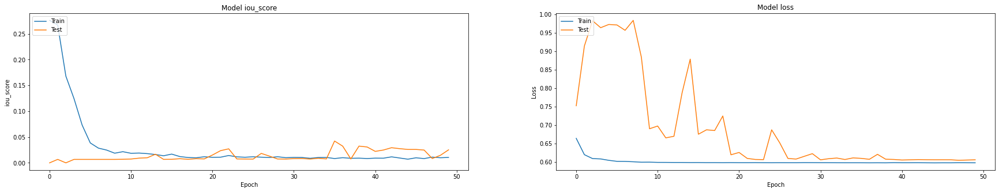

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JPL_b12_IOU0.0423.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


In [ ]:
print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

Loss: 0.60844
: 0.027915
: 0.041074
: 3.4644e+07
: 257.0
: 1.4522e+07
: 8.467e+05


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 0.60844
IOU:0.027915
F1 Score:0.041074
FN:34644360.0
FP:257.0
TN:14521858.0
TP:846701.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.99998


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'Sensitivity:{Sensitivity:.5}')

Sensitivity:0.023857


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

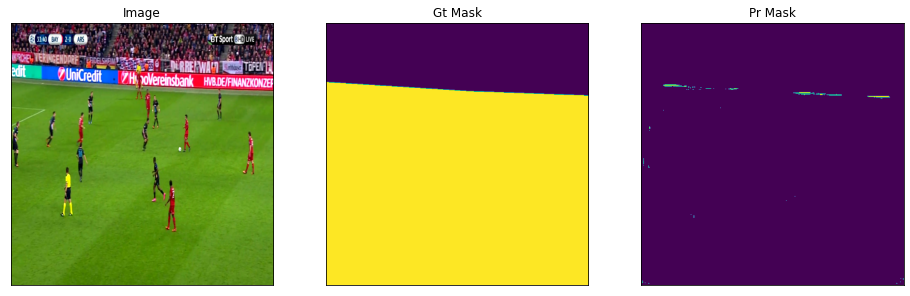

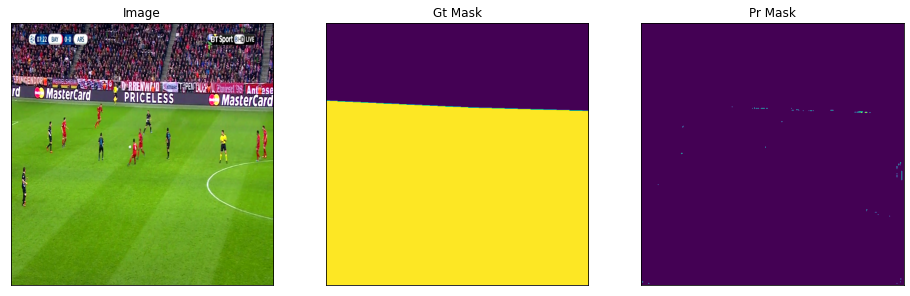

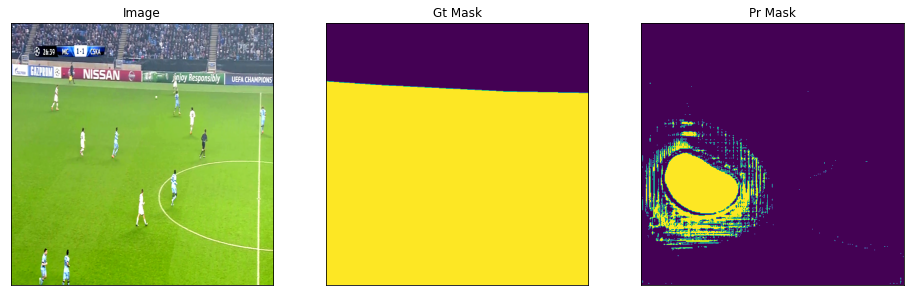

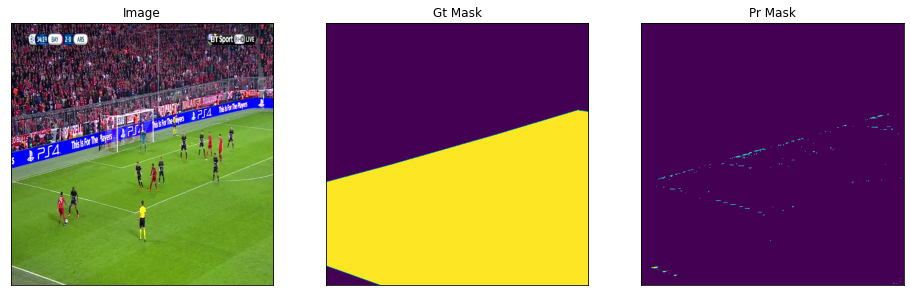

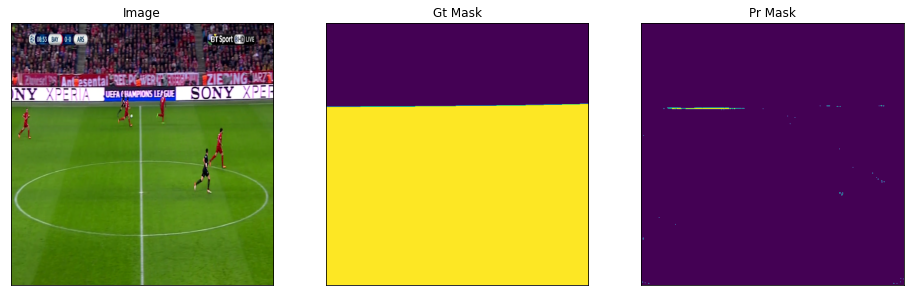

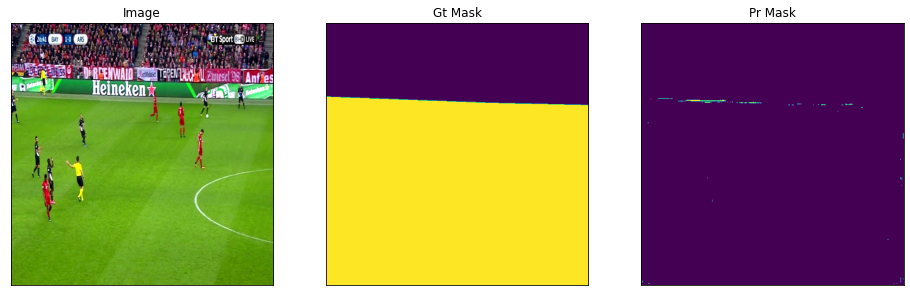

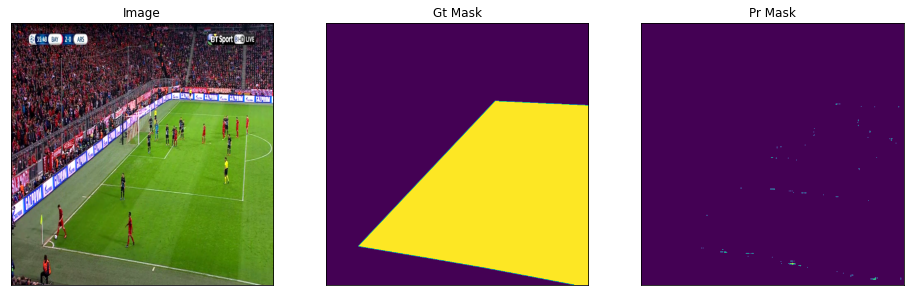

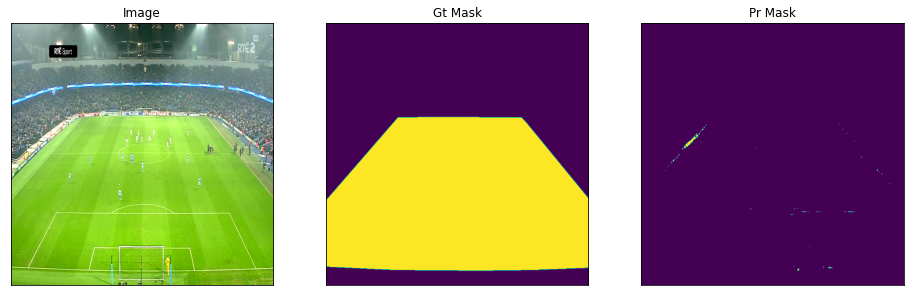

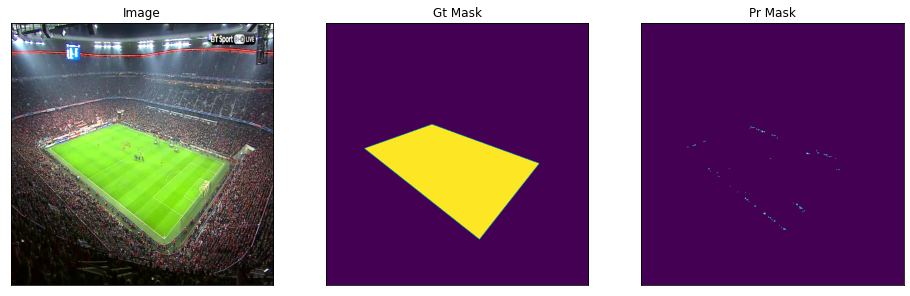

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

# Model With BCE+DL

In [ ]:
BATCH_SIZE = 10

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        #focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        #total_loss = dice_loss + (1 * focal_loss)
        total_loss = dice_loss 
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Accuracy()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        bce = sm.losses.BinaryCELoss()
        total_loss = bce+dice_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/

In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_DL+BCE_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 4457s 26s/step - loss: 1.1227 - iou_score: 0.1328 - f1-score: 0.2176 - false_negatives: 186189040.0000 - false_positives: 3047629.0000 - true_negatives: 217334656.0000 - true_positives: 87641808.0000 - val_loss: 1.4373 - val_iou_score: 3.1579e-04 - val_f1-score: 6.3130e-04 - val_false_negatives: 32796806.0000 - val_false_positives: 1612.0000 - val_true_negatives: 11285912.0000 - val_true_positives: 10135.0000
Epoch 2/50
167/167 [==============================] - 400s 2s/step - loss: 1.0504 - iou_score: 0.0064 - f1-score: 0.0124 - false_negatives: 272108576.0000 - false_positives: 34599.0000 - true_negatives: 220398816.0000 - true_positives: 1670994.0000 - val_loss: 1.9180 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 2.0000
Epoch 3/50
167/167 [==============================] - 397s 2s/step - loss: 1.0302 

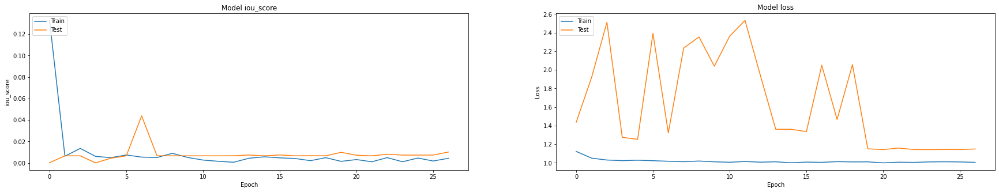

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_DL+BCE_b10_IOU0.0439.h5')

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

169/169 [==============================] - 54s 316ms/step - loss: 1.3177 - iou_score: 0.0554 - f1-score: 0.1045 - false_negatives: 33067982.0000 - false_positives: 352092.0000 - true_negatives: 14170023.0000 - true_positives: 2423080.0000
Loss: 1.3177
: 0.055426
: 0.10449
: 3.3068e+07
: 3.5209e+05
: 1.417e+07
: 2.4231e+06


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.3177
IOU:0.055426
F1 Score:0.10449
FN:33067982.0
FP:352092.0
TN:14170023.0
TP:2423080.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.97575


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'SP:{Sensitivity:.5}')

SP:0.068273


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)


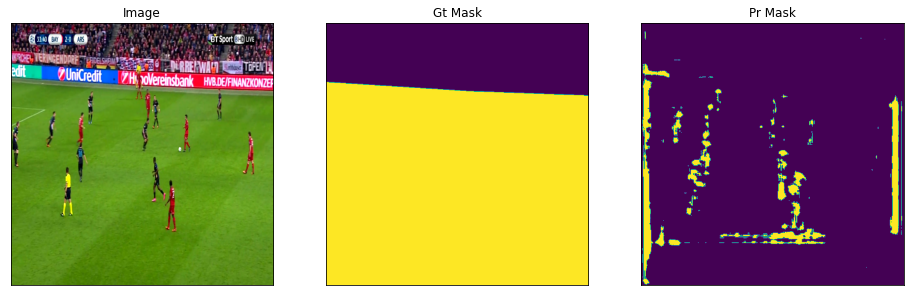

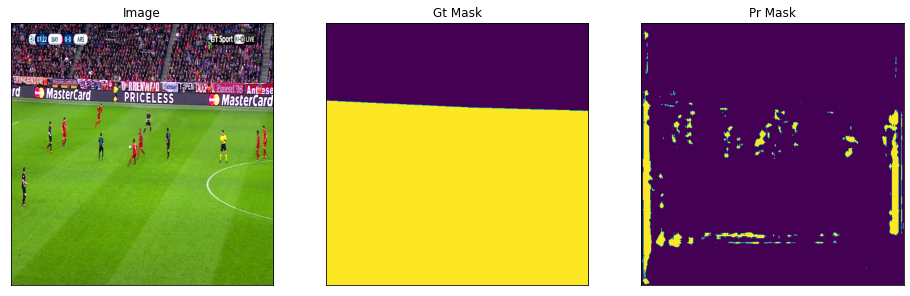

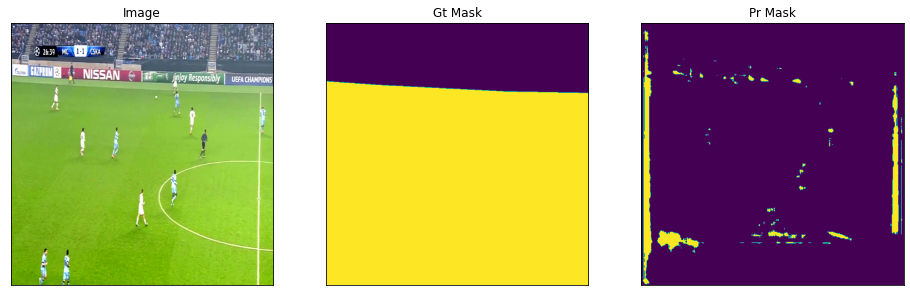

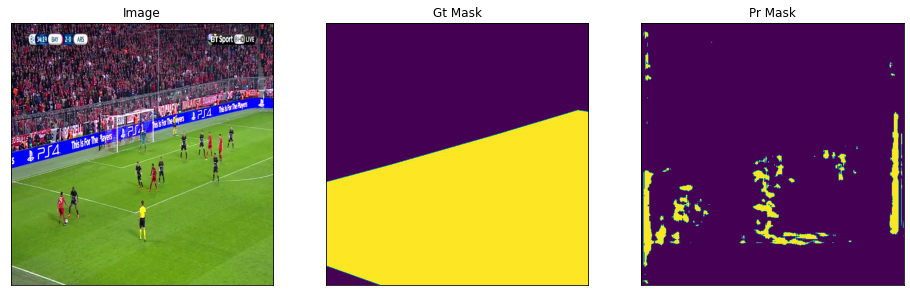

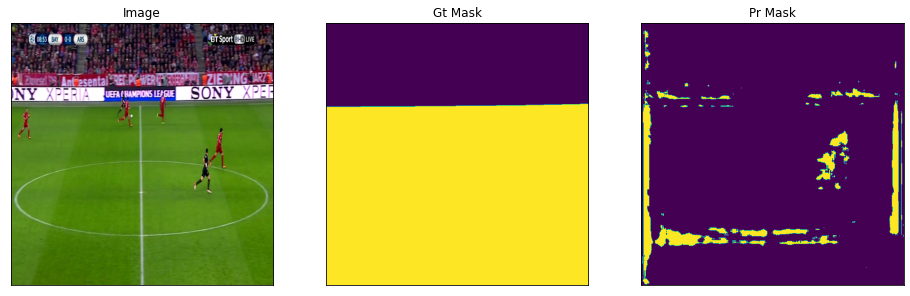

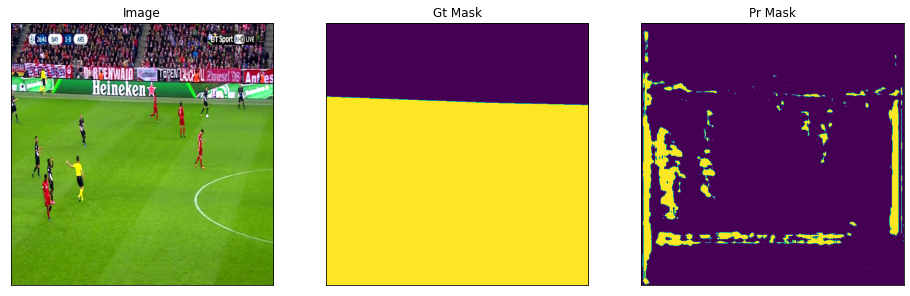

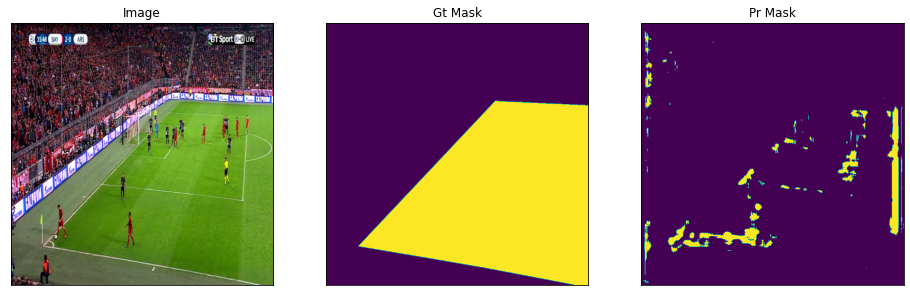

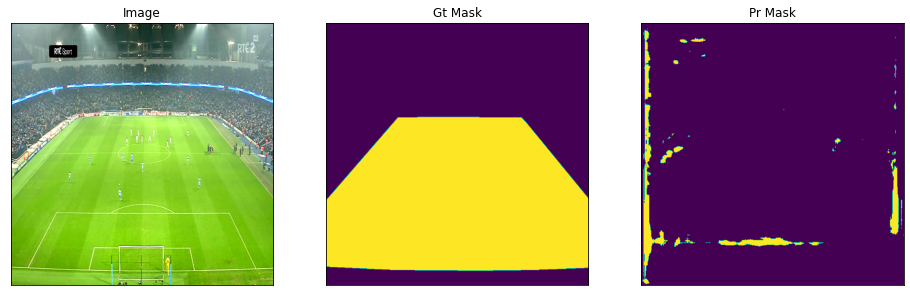

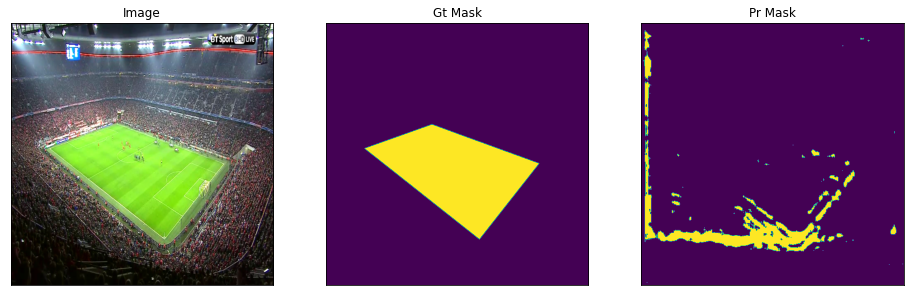

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        #focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        #total_loss = dice_loss + (1 * focal_loss)
        total_loss = dice_loss 
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Accuracy()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        bce = sm.losses.BinaryCELoss()
        total_loss = bce+dice_loss
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_DL+BCE_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 431s 3s/step - loss: 1.1046 - iou_score: 0.1449 - f1-score: 0.2391 - false_negatives: 181883520.0000 - false_positives: 2953040.0000 - true_negatives: 219235648.0000 - true_positives: 89549056.0000 - val_loss: 1.2973 - val_iou_score: 0.2141 - val_f1-score: 0.3509 - val_false_negatives: 14347467.0000 - val_false_positives: 2500082.0000 - val_true_negatives: 8787442.0000 - val_true_positives: 18459472.0000
Epoch 2/50
139/139 [==============================] - 389s 3s/step - loss: 1.0423 - iou_score: 0.0313 - f1-score: 0.0568 - false_negatives: 261035504.0000 - false_positives: 111891.0000 - true_negatives: 221515456.0000 - true_positives: 10958372.0000 - val_loss: 1.4634 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives: 32806940.0000 - val_false_positives: 0.0000e+00 - val_true_negatives: 11287524.0000 - val_true_positives: 0.0000e+00
Epoch 3/50
139/139 [==============================] - 392s 3s/step - loss: 1.0298

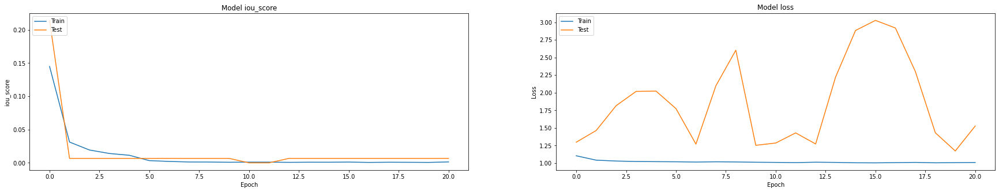

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_DL+BCE_b12_IOU0.2141.h5')

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

169/169 [==============================] - 43s 226ms/step - loss: 1.2890 - iou_score: 0.2116 - f1-score: 0.3462 - false_negatives_1: 15344891.0000 - false_positives_1: 3091189.0000 - true_negatives_1: 11430926.0000 - true_positives_1: 20146180.0000
Loss: 1.289
: 0.21165
: 0.34625
: 1.5345e+07
: 3.0912e+06
: 1.1431e+07
: 2.0146e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.289
IOU:0.21165
F1 Score:0.34625
FN:15344891.0
FP:3091189.0
TN:11430926.0
TP:20146180.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.78714


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'SP:{Sensitivity:.5}')

SP:0.56764


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

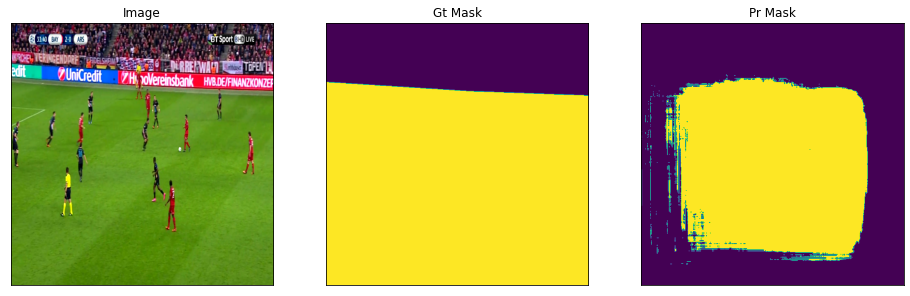

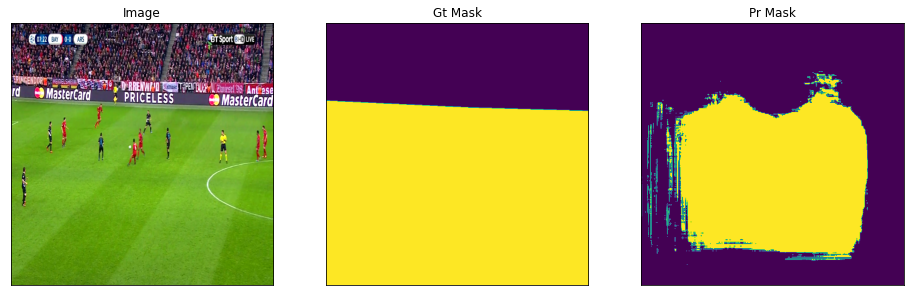

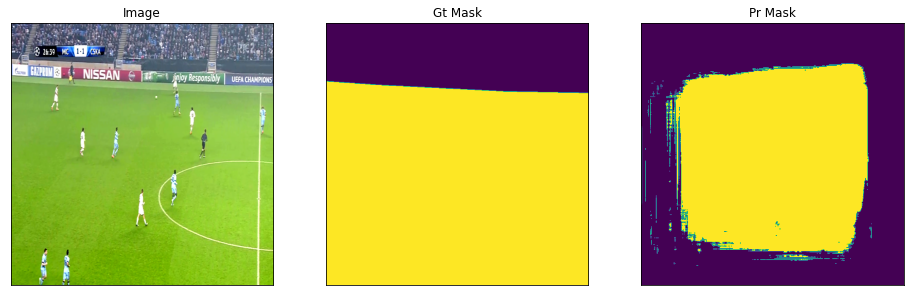

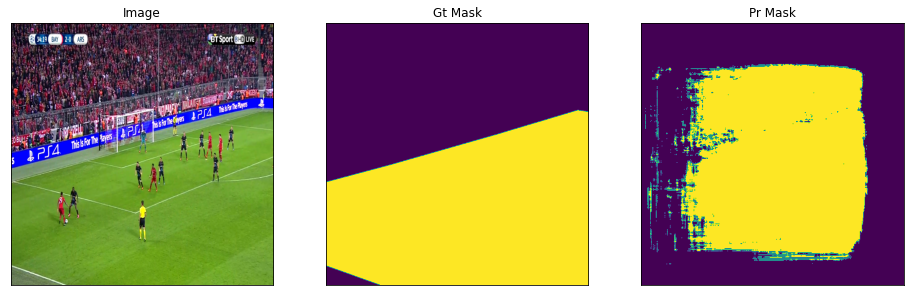

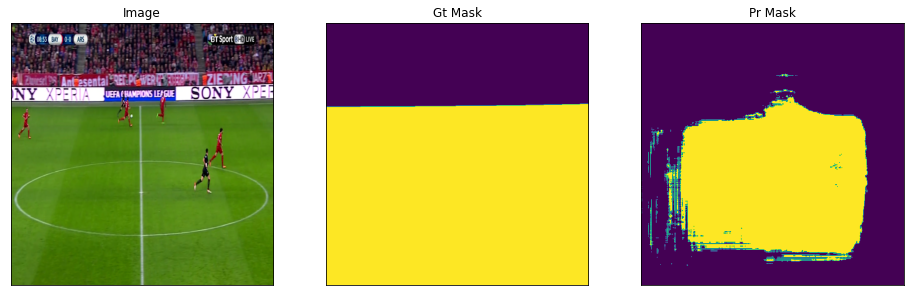

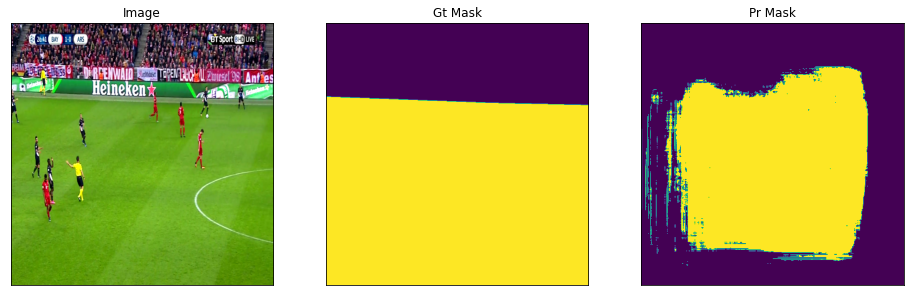

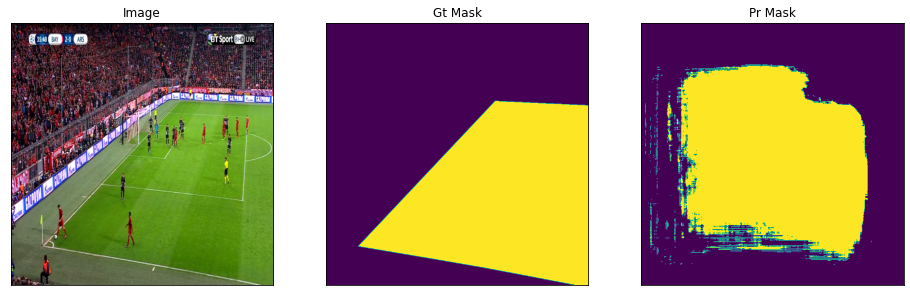

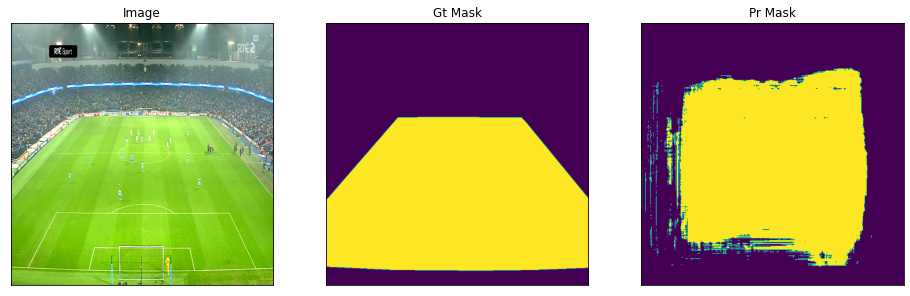

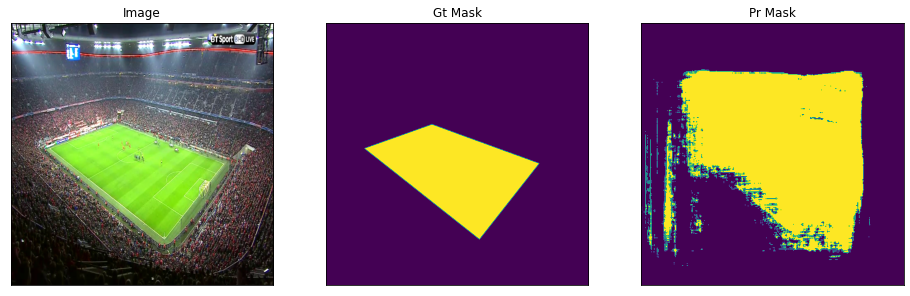

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

#Model with JL+BCE

In [ ]:
BATCH_SIZE = 10

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        #focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        #total_loss = dice_loss + (1 * focal_loss)
        total_loss = dice_loss 
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Accuracy()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        JaccardLoss = sm.losses.JaccardLoss()
        bce = sm.losses.BinaryCELoss()
        total_loss = JaccardLoss+bce
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL+BCE_b10_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=10,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
167/167 [==============================] - 426s 2s/step - loss: 1.2446 - iou_score: 0.1191 - f1-score: 0.2043 - false_negatives_1: 211422592.0000 - false_positives_1: 1720683.0000 - true_negatives_1: 225393664.0000 - true_positives_1: 55676248.0000 - val_loss: 1.5157 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 2/50
167/167 [==============================] - 391s 2s/step - loss: 1.1752 - iou_score: 0.0126 - f1-score: 0.0244 - false_negatives_1: 266391200.0000 - false_positives_1: 16725.0000 - true_negatives_1: 224589312.0000 - true_positives_1: 3215855.0000 - val_loss: 1.6615 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_1: 32806940.0000 - val_false_positives_1: 0.0000e+00 - val_true_negatives_1: 11287524.0000 - val_true_positives_1: 0.0000e+00
Epoch 3/50
167/167 [==============================] - 4

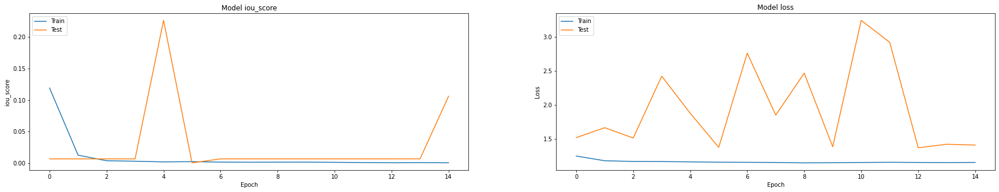

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL+BCE_b10_IOU0.2264.h5')

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

169/169 [==============================] - 45s 220ms/step - loss: 1.8929 - iou_score: 0.2162 - f1-score: 0.3520 - false_negatives_2: 1416935.0000 - false_positives_2: 11873847.0000 - true_negatives_2: 2648268.0000 - true_positives_2: 34074128.0000
Loss: 1.8929
: 0.21617
: 0.35198
: 1.4169e+06
: 1.1874e+07
: 2.6483e+06
: 3.4074e+07


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.8929
IOU:0.21617
F1 Score:0.35198
FN:1416935.0
FP:11873847.0
TN:2648268.0
TP:34074128.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:0.18236


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'SP:{Sensitivity:.5}')

SP:0.96008


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

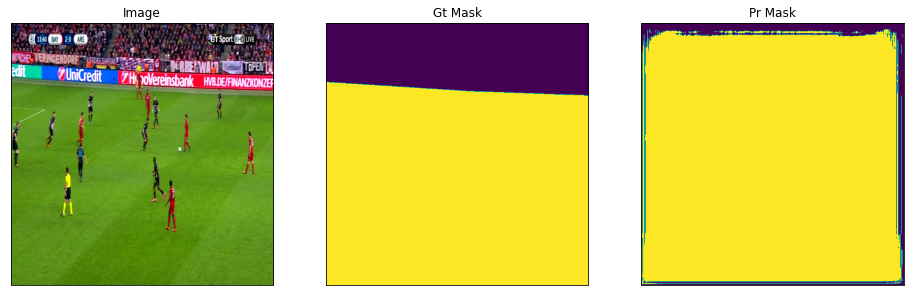

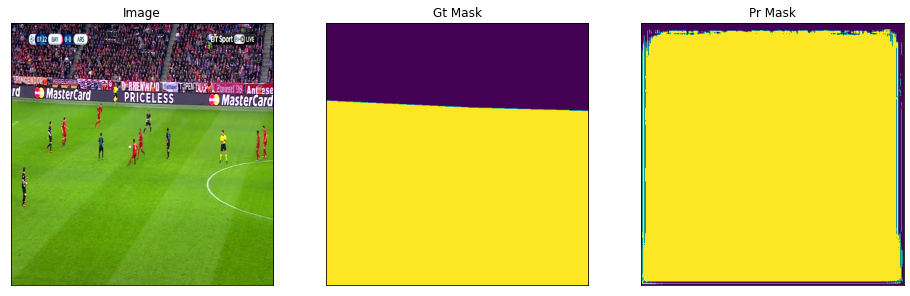

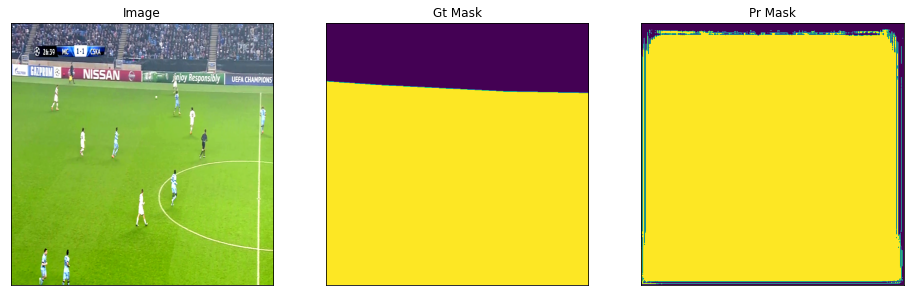

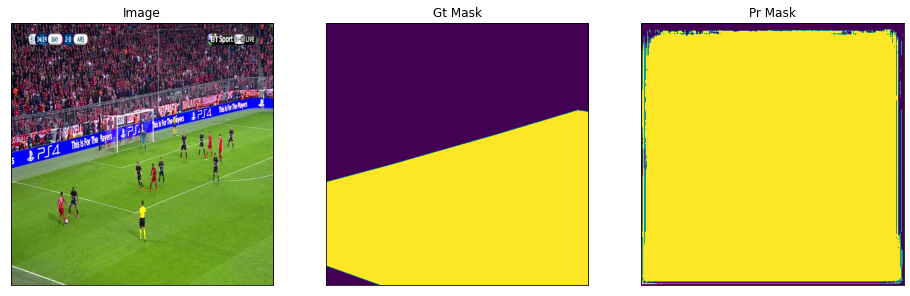

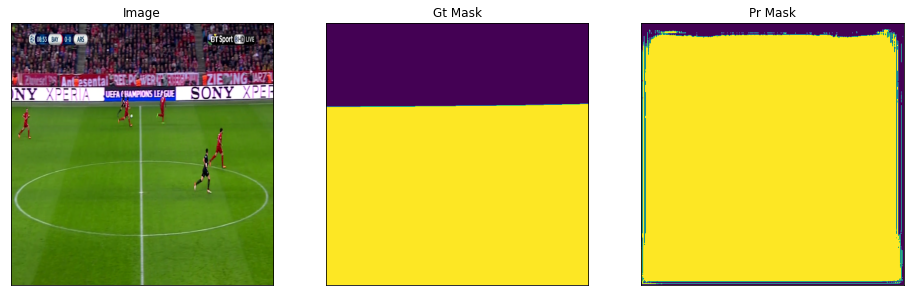

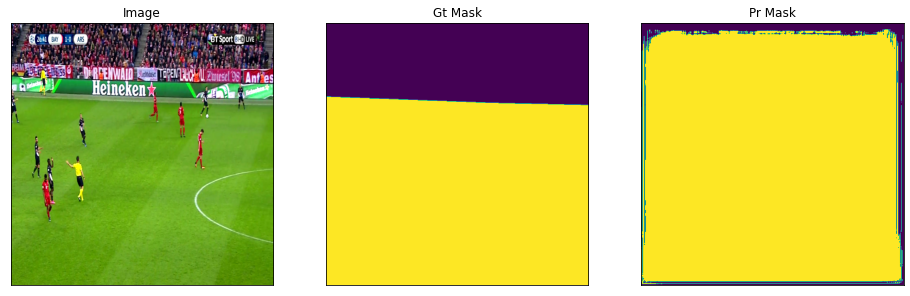

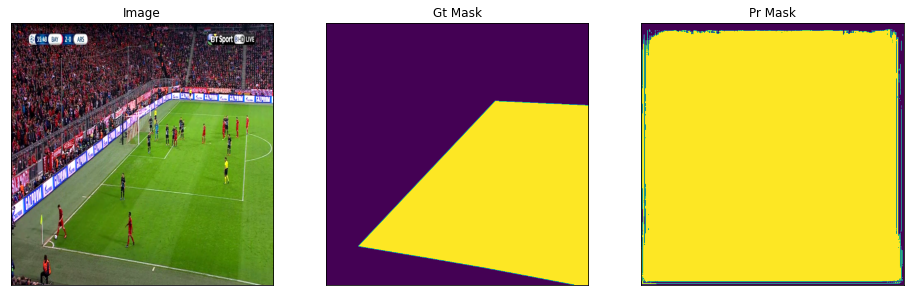

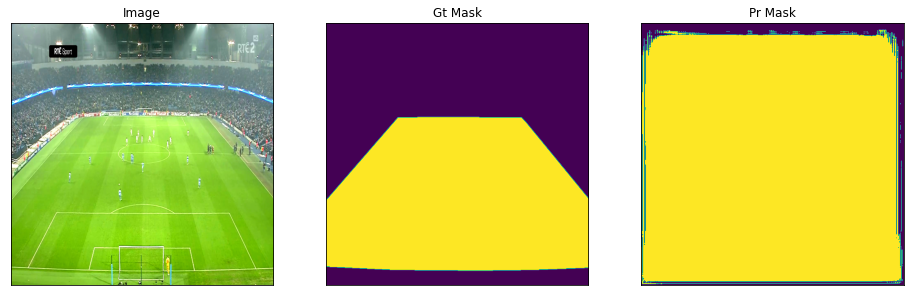

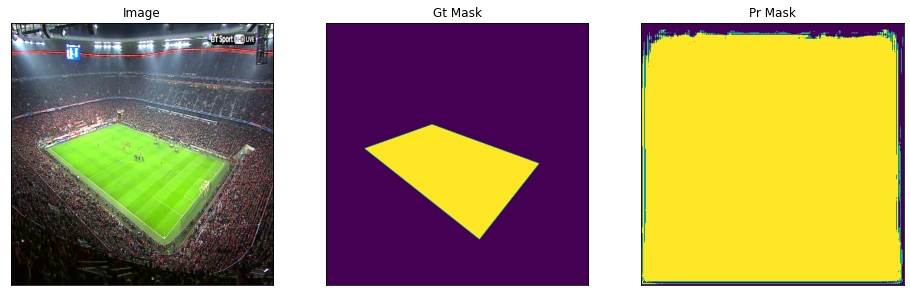

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )

In [ ]:
BATCH_SIZE = 12

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss 
use_tpu = False
if use_tpu:
    # Create distribution strategy
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)

    # Create model on TPU:
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        dice_loss = sm.losses.DiceLoss()
        #focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
        #total_loss = dice_loss + (1 * focal_loss)
        total_loss = dice_loss 
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.Precision(), tf.keras.metrics.Accuracy()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

use_gpu = True
if use_gpu == True:

    #tf.debugging.set_log_device_placement(True)

    strategy = tf.distribute.MirroredStrategy()
    with strategy.scope():
        #create model
        model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
        # define optomizer
        optim = keras.optimizers.Adam(LR)
        # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
        JaccardLoss = sm.losses.JaccardLoss()
        bce = sm.losses.BinaryCELoss()
        total_loss = JaccardLoss+bce
        metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), tf.keras.metrics.FalseNegatives(), 
                   tf.keras.metrics.FalsePositives(), tf.keras.metrics.TrueNegatives(), tf.keras.metrics.TruePositives()]

        # compile keras model with defined optimozer, loss and metrics
        model.compile(optim, total_loss, metrics)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, 544, 544, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, 544,544)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    keras.callbacks.ModelCheckpoint(DATA_DIR+'Models/best_model_tf_Densenet_JL+BCE_b12_IOU{val_iou_score:.4f}.h5', save_weights_only=True, monitor='val_iou_score', save_best_only=True, mode='max'),
    keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, mode='min'),
    keras.callbacks.EarlyStopping(monitor='val_iou_score', min_delta=0, patience=20,mode='max', baseline=None, restore_best_weights=False),
]

In [ ]:
# train model
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader),
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader,
    validation_steps=len(valid_dataloader),
)

Epoch 1/50
139/139 [==============================] - 436s 3s/step - loss: 1.2609 - iou_score: 0.1047 - f1-score: 0.1734 - false_negatives_2: 202481216.0000 - false_positives_2: 3895610.0000 - true_negatives_2: 219672608.0000 - true_positives_2: 67571784.0000 - val_loss: 1.5080 - val_iou_score: 7.7591e-06 - val_f1-score: 1.5484e-05 - val_false_negatives_2: 32806692.0000 - val_false_positives_2: 56.0000 - val_true_negatives_2: 11287468.0000 - val_true_positives_2: 247.0000
Epoch 2/50
139/139 [==============================] - 403s 3s/step - loss: 1.1853 - iou_score: 0.0049 - f1-score: 0.0095 - false_negatives_2: 269435168.0000 - false_positives_2: 27299.0000 - true_negatives_2: 222915424.0000 - true_positives_2: 1243385.0000 - val_loss: 1.6667 - val_iou_score: 0.0067 - val_f1-score: 0.0067 - val_false_negatives_2: 32806940.0000 - val_false_positives_2: 0.0000e+00 - val_true_negatives_2: 11287524.0000 - val_true_positives_2: 0.0000e+00
Epoch 3/50
139/139 [==============================] 

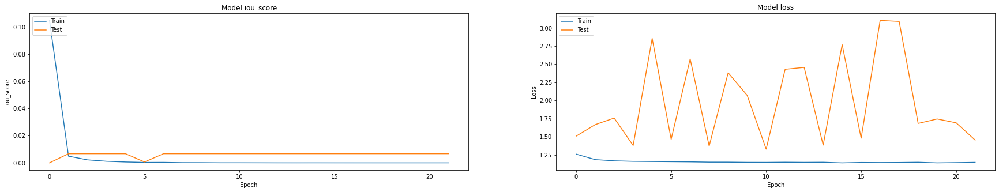

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloder(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model.load_weights(DATA_DIR+'Models/Densenet_models/best_model_tf_Densenet_JL+BCE_b12_IOU0.0067.h5')

In [ ]:
scores = model.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print(": {:.5}".format(value))

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1973: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


Loss: 1.6351
: 0.011834
: 0.011834
: 3.5491e+07
: 0.0
: 1.4522e+07
: 0.0


In [ ]:
print("Loss: {:.5}".format(scores[0]))
print(F'IOU:{scores[1]:.5}')
print(F'F1 Score:{scores[2]:.5}')
print(F'FN:{scores[3]}')
print(F'FP:{scores[4]}')
print(F'TN:{scores[5]}')
print(F'TP:{scores[6]}')

Loss: 1.6351
IOU:0.011834
F1 Score:0.011834
FN:35491076.0
FP:0.0
TN:14522115.0
TP:0.0


In [ ]:
sp = scores[5]/(scores[5]+scores[4])
print(F'SP:{sp:.5}')

SP:1.0


In [ ]:
Sensitivity = scores[6]/(scores[6]+scores[3])
print(F'SP:{Sensitivity:.5}')

SP:0.0


In [ ]:
test_dataset_vis = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES,
)

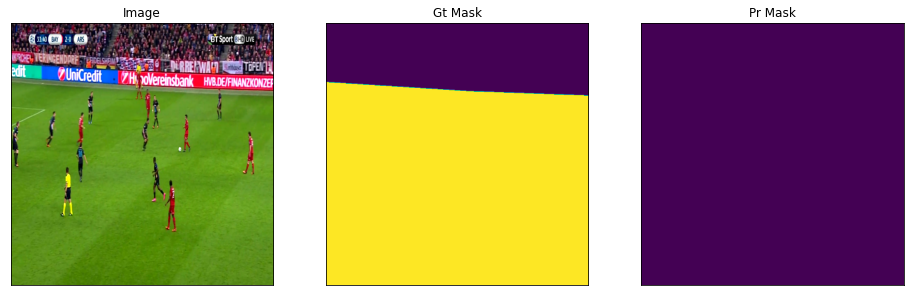

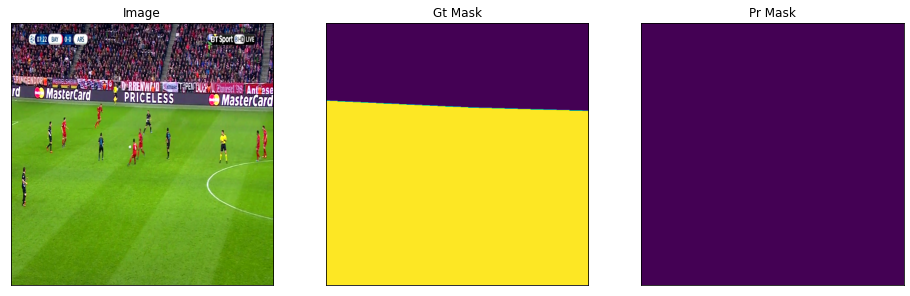

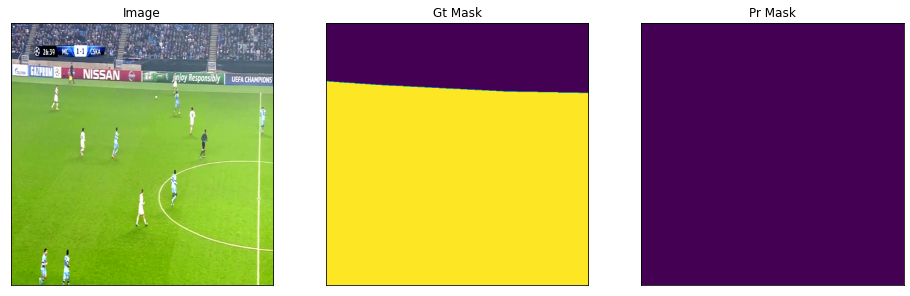

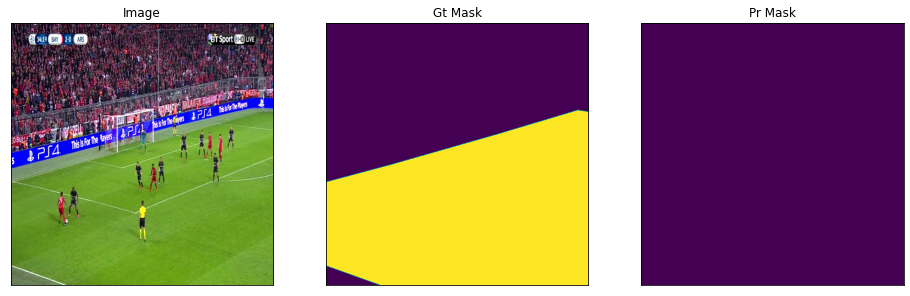

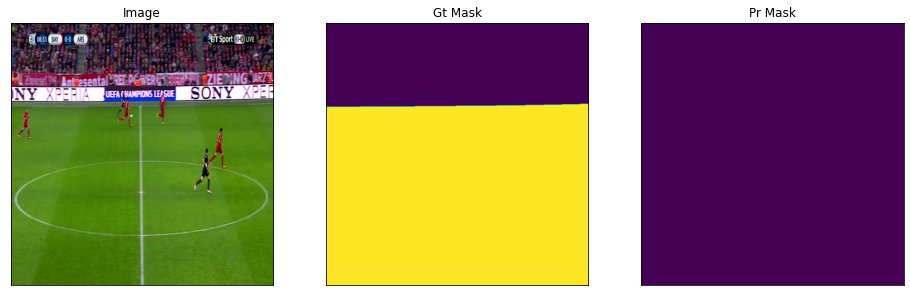

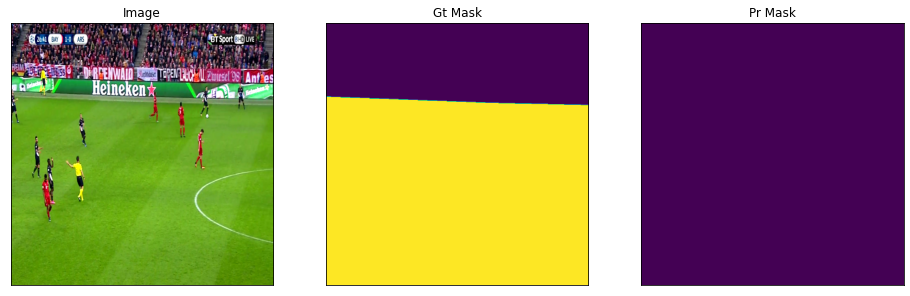

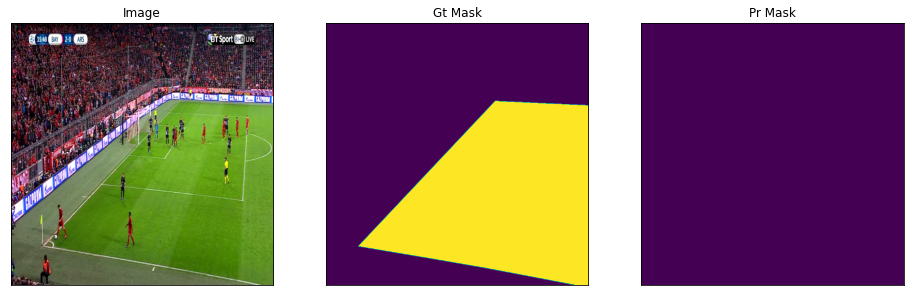

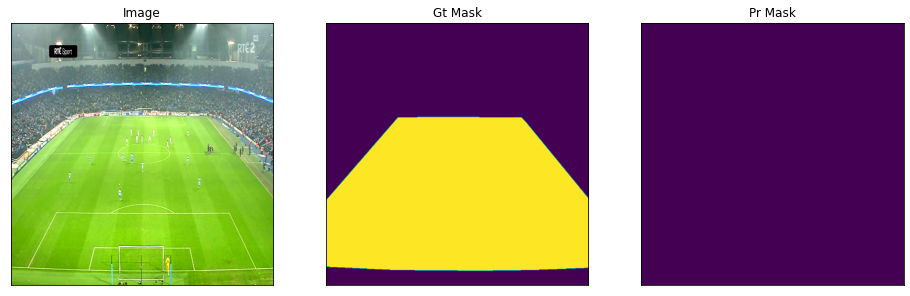

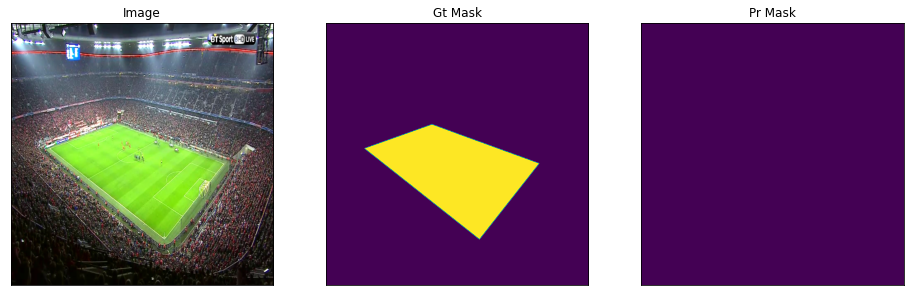

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in range(160,169):
    
    image, gt_mask = test_dataset[i]
    image_gt, _ = test_dataset_vis[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    
    visualize(save=False,
        image=denormalize(image_gt.squeeze()),
        gt_mask=gt_mask.squeeze(),
        pr_mask=pr_mask.squeeze(),
    )